## Problems: (Geron, 15.10)

<img width = 800 src = http://www.bach-chorales.com/Images/ChoraleImages/Image_BWV_0133_6.jpg>

Download the [Bach chorales dataset](https://homl.info/bach) and unzip it. It is composed of 382 chorales composed by Johann Sebastian Bach. Each chorale is 100 to 640 time steps long, and each time step contains 4 integers, where each integer corresponds to a note’s index on a piano (except for the value 0, which means that no note is played).

Train a model — recurrent, convolutional, or both — that can predict the next time step (four notes), given a sequence of time steps from a chorale. Then use this model to generate Bach-like music, one note at a time: you can do this by giving the model the start of a chorale and asking it to predict the next time step, then appending these time steps to the input sequence and asking the model for the next note, and so on. Also make sure to check out [Google’s Coconet model](https://magenta.tensorflow.org/coconet), which was used for a nice Google doodle about Bach.

#### Further information

At each time step, each chorales has 4 notes. Looking at the CSV for one of  the files we see that the columns are __note0__, __note1__, __note2__ and __note3__, with each row corresponding to a timestep. Each of the numbers corresponds to a piano key.

In [1]:
import numpy as np
import pandas as pd
import os

#training files
folder_path_train = 'C:/Users/burch/Downloads/bach_chorales/jsb_chorales/train'
file_names_train = os.listdir(folder_path_train)
train_files = []

for file_name in file_names_train:
    file_path = os.path.join(folder_path_train, file_name)
    train_files.append(pd.read_csv(file_path))

#testing files
folder_path_test = 'C:/Users/burch/Downloads/bach_chorales/jsb_chorales/test'
file_names_test = os.listdir(folder_path_test)
test_files = []

for file_name in file_names_test:
    file_path = os.path.join(folder_path_test, file_name)
    test_files.append(pd.read_csv(file_path))
    
#validation files
folder_path_valid = 'C:/Users/burch/Downloads/bach_chorales/jsb_chorales/valid'
file_names_valid = os.listdir(folder_path_valid)
valid_files = []

for file_name in file_names_valid:
    file_path = os.path.join(folder_path_valid, file_name)
    valid_files.append(pd.read_csv(file_path))

In [2]:
train_files[0], valid_files[0]

(     note0  note1  note2  note3
 0       74     70     65     58
 1       74     70     65     58
 2       74     70     65     58
 3       74     70     65     58
 4       75     70     58     55
 ..     ...    ...    ...    ...
 187     70     65     62     46
 188     70     65     62     46
 189     70     65     62     46
 190     70     65     62     46
 191     70     65     62     46
 
 [192 rows x 4 columns],
      note0  note1  note2  note3
 0       72     67     60     48
 1       72     67     60     48
 2       72     67     60     48
 3       72     67     60     48
 4       72     67     64     48
 ..     ...    ...    ...    ...
 191     72     67     64     48
 192     72     67     64     48
 193     72     67     64     48
 194     72     67     64     48
 195     72     67     64     48
 
 [196 rows x 4 columns])

In [3]:
#convert to numpy arrays

train = [panda.to_numpy() for panda in train_files]
valid = [panda.to_numpy() for panda in valid_files]
test = [panda.to_numpy() for panda in test_files]

In [4]:
train[0]

array([[74, 70, 65, 58],
       [74, 70, 65, 58],
       [74, 70, 65, 58],
       [74, 70, 65, 58],
       [75, 70, 58, 55],
       [75, 70, 58, 55],
       [75, 70, 60, 55],
       [75, 70, 60, 55],
       [77, 69, 62, 50],
       [77, 69, 62, 50],
       [77, 69, 62, 50],
       [77, 69, 62, 50],
       [77, 70, 62, 55],
       [77, 70, 62, 55],
       [77, 69, 62, 55],
       [77, 69, 62, 55],
       [75, 67, 63, 48],
       [75, 67, 63, 48],
       [75, 69, 63, 48],
       [75, 69, 63, 48],
       [74, 70, 65, 46],
       [74, 70, 65, 46],
       [74, 70, 65, 46],
       [74, 70, 65, 46],
       [72, 69, 65, 53],
       [72, 69, 65, 53],
       [72, 69, 65, 53],
       [72, 69, 65, 53],
       [72, 69, 65, 53],
       [72, 69, 65, 53],
       [72, 69, 65, 53],
       [72, 69, 65, 53],
       [74, 70, 65, 46],
       [74, 70, 65, 46],
       [74, 70, 65, 46],
       [74, 70, 65, 46],
       [75, 69, 63, 48],
       [75, 69, 63, 48],
       [75, 67, 63, 48],
       [75, 67, 63, 48],


In [5]:
#notes range from 36 to 81

notes = set(range(36, 82))
notes.add(0) #for when no note is played
num_notes = len(notes)
min_note = 36
max_note = 81

The following further processing of the chorales is taken directly from [one of Geron's Jupyter notebooks](https://github.com/ageron/handson-ml2/blob/master/15_processing_sequences_using_rnns_and_cnns.ipynb) that accompany his textbook Hands-On Machine Learning. I summarize the processing below.

Create a function which takes an array with shape (n, 2). Two new arrays obtained by slicing off the last column and first column respectively. Returns X, Y

The preprocess function shifts all the notes down by 35. Then makes it a one-dimensional arpegio.

Then:
1)Increase batch size by 1.
2)Create overlapping windows of size window_size + 1

Ragged constant tensors allow working with chorales of different sizes.

In [6]:
import tensorflow as tf
import keras

def create_target(batch):
    X = batch[:, :-1]
    Y = batch[:, 1:] # predict next note in each arpegio, at each step
    return X, Y

def preprocess(window):
    window = tf.where(window == 0, window, window - min_note + 1) # shift values
    return tf.reshape(window, [-1]) # convert to arpegio

def bach_dataset(chorales, batch_size=32, shuffle_buffer_size=None,
                 window_size=32, window_shift=16, cache=True):
    def batch_window(window):
        return window.batch(window_size + 1)

    def to_windows(chorale):
        dataset = tf.data.Dataset.from_tensor_slices(chorale)
        dataset = dataset.window(window_size + 1, window_shift, drop_remainder=True)
        return dataset.flat_map(batch_window)

    chorales = tf.ragged.constant(chorales, ragged_rank=1)
    dataset = tf.data.Dataset.from_tensor_slices(chorales)
    dataset = dataset.flat_map(to_windows).map(preprocess)
    if cache:
        dataset = dataset.cache()
    if shuffle_buffer_size:
        dataset = dataset.shuffle(shuffle_buffer_size)
    dataset = dataset.batch(batch_size)
    dataset = dataset.map(create_target)
    return dataset.prefetch(1)

In [7]:
train_data = bach_dataset(train, shuffle_buffer_size=1000)
valid_data = bach_dataset(valid)
test_data = bach_dataset(test)

In [10]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, LSTM, Dense, Conv1D, BatchNormalization

In the preprocessing, sequences of notes were converted into one dimensional arpegios, so I'm using a one-dimensional convolution layer in the first layers. Eventually I pass to two LSTM layers. Batch normalization is used throughout to address overfitting.

The final validation losses don't look great, although they did decline over epochs which is promising. The validation accuracy rounds out at 82%, which I am satisfied with.

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_4 (Embedding)     (None, None, 5)           235       
                                                                 
 conv1d_5 (Conv1D)           (None, None, 32)          992       
                                                                 
 batch_normalization_6 (Batc  (None, None, 32)         128       
 hNormalization)                                                 
                                                                 
 conv1d_6 (Conv1D)           (None, None, 64)          6208      
                                                                 
 batch_normalization_7 (Batc  (None, None, 64)         256       
 hNormalization)                                                 
                                                                 
 lstm_4 (LSTM)               (None, None, 128)        

NameError: name 'plt' is not defined

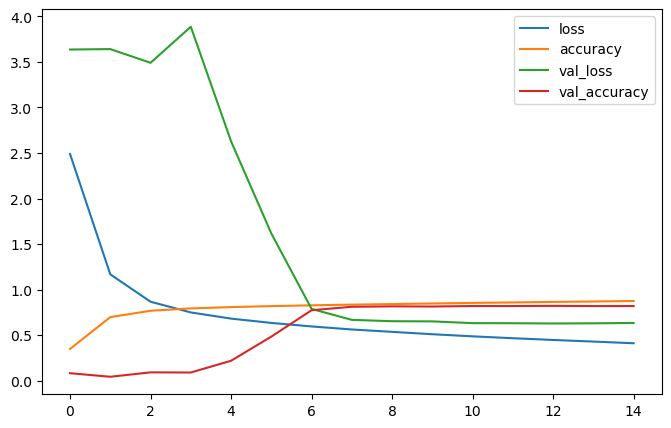

In [14]:
model = Sequential()

model.add(Embedding(input_dim = num_notes, output_dim = 5, input_shape = [None]))
model.add(Conv1D(32, kernel_size = 6, padding="causal", activation="relu", dilation_rate=2))
model.add(BatchNormalization())
model.add(Conv1D(64, kernel_size = 3, padding = 'causal', activation = 'relu', dilation_rate=4))
model.add(BatchNormalization())
model.add(LSTM(128, return_sequences = True))
model.add(BatchNormalization())
model.add(LSTM(128, return_sequences = True))
model.add(Dense(num_notes, activation = 'sigmoid'))

model.summary()

model.compile(optimizer='adam', loss="sparse_categorical_crossentropy", metrics=["accuracy"])
history = model.fit(train_data, epochs=15, validation_data = valid_data)

pd.DataFrame(history.history).plot(figsize=(8, 5))
plt.grid(True)
plt.ylim(0, 3)

In [15]:
#model performs decently on the test data

model.evaluate(test_data)

34/34 [==============================] - 3s 74ms/step - loss: 0.6454 - accuracy: 0.8136


[0.6454488635063171, 0.813574492931366]

In [16]:
model.save('bach_chorales_model.h5')

Now comes the fun part. I'm going to actually listen to the chorales that my model makes.

For generating the audio, I will once again use Geron's code in the [notebook](https://github.com/ageron/handson-ml2/blob/master/15_processing_sequences_using_rnns_and_cnns.ipynb) mentioned in Part 1.

In [17]:
#this code allows us to play audio files

from IPython.display import Audio

def notes_to_frequencies(notes):
    # Frequency doubles when you go up one octave; there are 12 semi-tones
    # per octave; Note A on octave 4 is 440 Hz, and it is note number 69.
    return 2 ** ((np.array(notes) - 69) / 12) * 440

def frequencies_to_samples(frequencies, tempo, sample_rate):
    note_duration = 60 / tempo # the tempo is measured in beats per minutes
    # To reduce click sound at every beat, we round the frequencies to try to
    # get the samples close to zero at the end of each note.
    frequencies = np.round(note_duration * frequencies) / note_duration
    n_samples = int(note_duration * sample_rate)
    time = np.linspace(0, note_duration, n_samples)
    sine_waves = np.sin(2 * np.pi * frequencies.reshape(-1, 1) * time)
    # Removing all notes with frequencies ≤ 9 Hz (includes note 0 = silence)
    sine_waves *= (frequencies > 9.).reshape(-1, 1)
    return sine_waves.reshape(-1)

def chords_to_samples(chords, tempo, sample_rate):
    freqs = notes_to_frequencies(chords)
    freqs = np.r_[freqs, freqs[-1:]] # make last note a bit longer
    merged = np.mean([frequencies_to_samples(melody, tempo, sample_rate)
                     for melody in freqs.T], axis=0)
    n_fade_out_samples = sample_rate * 60 // tempo # fade out last note
    fade_out = np.linspace(1., 0., n_fade_out_samples)**2
    merged[-n_fade_out_samples:] *= fade_out
    return merged

def play_chords(chords, tempo=160, amplitude=0.1, sample_rate=44100, filepath=None):
    samples = amplitude * chords_to_samples(chords, tempo, sample_rate)
    if filepath:
        from scipy.io import wavfile
        samples = (2**15 * samples).astype(np.int16)
        wavfile.write(filepath, sample_rate, samples)
        return display(Audio(filepath))
    else:
        return display(Audio(samples, rate=sample_rate))

In [20]:
#let's test it out

play_chords(train_files[0])

In [26]:
#see how the model does, seeding on the first 15 notes
seed_chords = train_files[0][:15]

new_chorale= generate_chorale(model, seed_chords, 100)
play_chords(new_chorale, filepath="bach_cold.wav")

1/1 [==============================] - 0s 79ms/step


1/1 [==============================] - 0s 94ms/step


1/1 [==============================] - 0s 107ms/step


This chorale clearly is not a very good approximation of Bach. I played with the parameters quite a bit, and in each case the generated chorale was a lot more dissonant than Bach.

It appears I was unable to bring him 'Bach' from the dead!